In [1]:
import mne
import pandas as pd
import numpy as np
import os
from tqdm import tqdm_notebook
import gc
%matplotlib tk

ModuleNotFoundError: No module named 'mne'

In [2]:
bad = pd.read_excel('bad_epochs.xlsx')
bad

,Subjects,Indexes of epochs to be dropped
0,sub-003,"[0, 2, 5, 23, 43, 88, 96, 107]"
1,sub-004,"[3, 15, 17, 21, 26, 30, 44, 46, 60, 67, 72, 73..."
2,sub-005,[19]
3,sub-006,"[11, 13, 36, 41, 58, 93, 98, 103, 106, 109, 11..."
4,sub-007,"[6, 9, 43, 79]"
5,sub-008,"[1, 16, 29, 49, 50, 70, 85, 90, 102, 110]"
6,sub-011,"[2, 7, 14, 22, 32, 45, 59, 66, 71, 90, 109, 11..."
7,sub-012,"[2, 5, 12, 18, 21, 23, 24, 27, 28, 32, 33, 37,..."
8,sub-013,"[0, 1, 8, 11, 19, 23, 24, 25, 27, 34, 38, 41, ..."
9,sub-014,"[7, 18, 23, 27, 40, 49, 52, 53, 58, 74, 81, 82..."


In [3]:
import ast
x = '[ "A","B","C" , " D"]'
x = ast.literal_eval(x)

In [ ]:
bad[bad['Subjects'] == 'sub-003']['Indexes of epochs to be dropped']

0    [0, 2, 5, 23, 43, 88, 96, 107]
Name: Indexes of epochs to be dropped, dtype: object

In [30]:
ast.literal_eval(list(bad[bad['Subjects'] == 'sub-003']['Indexes of epochs to be dropped'])[0])

[0, 2, 5, 23, 43, 88, 96, 107]

In [4]:
import warnings
import logging
import pandas as pd

warnings.filterwarnings("ignore")

logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)
logging.getLogger("mne").setLevel(logging.WARNING)

In [3]:
raw = mne.io.read_raw('eeg/sub-003_experiment.fif', preload = True)
events, ids = mne.events_from_annotations(raw)
events = events[events[:, 2] == 3][2:] 
epochs = mne.Epochs(
        raw, events=events, tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )

In [12]:
epochs_copy = epochs.copy()
epochs_copy.plot(block = True)
bad_indices = [i for i, log in enumerate(epochs_copy.drop_log) if log != ()]
print("Индексы плохих эпох:", bad_indices)

Индексы плохих эпох: [10, 66]


In [16]:
epochs_names, epochs_bads = [], []
for i in os.listdir('epochs'):
    epochs = mne.read_epochs('epochs/'+i, preload = True)
    bad_indices = [i for i, log in enumerate(epochs.drop_log) if log != ()]
    epochs_names.append(i.split('_')[0])
    epochs_bads.append(bad_indices)
df = pd.DataFrame({'Subjects': epochs_names, 'Indexes of epochs to be dropped': epochs_bads})
df.to_excel('bad_epochs.xlsx')

# Создаём эпохи


In [36]:
name

'sub-003'

In [43]:
x = np.array([[1,2,3],
        [4,5,6],
        [7,8,9]])

In [45]:
np.delete(x, [], axis=0)

array([[1, 2, 3],
       [4, 5, 6],
       [7, 8, 9]])

In [41]:
import numpy as np 
arr = np.array([[ 0.96488889, 0.73641667, 0.67521429, 0.592875, 0.53172222],[ 0.78008333, 0.5938125, 0.481, 0.39883333, 0.]])
print(arr[np.where(arr != 0)])

[0.96488889 0.73641667 0.67521429 0.592875   0.53172222 0.78008333
 0.5938125  0.481      0.39883333]


In [51]:
df['experience'].dropna()

1      high
2       low
4      high
5       low
6      high
       ... 
120    high
121     low
122    high
123    high
124    high
Name: experience, Length: 122, dtype: object

In [52]:
df['rating'].dropna()

1         low
2        high
4         low
5        high
6        high
        ...  
120       low
121    filler
122      high
123       low
124       low
Name: rating, Length: 122, dtype: object

**Конгруэнтные/неконгруэнтные**


In [55]:
#cog = []
#incog = []
#filler = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
        print(bads)
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    res = []
    for i in range(120):
        if slider[i] < 4 and cond[i] == 'Правда' or slider[i] > 4 and cond[i] == 'Обман':
            res.append('incog')
        if slider[i] > 4 and cond[i] == 'Правда' or slider[i] < 4 and cond[i] == 'Обман':
            res.append('cog')
        if slider[i] == 4:
            res.append('filler')
    dct = {'cog' : 1, 'incog' : 2, 'filler' : 3}
    ddct = {1 : 'cog', 2 : 'incog', 3 : 'filler'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    if name == 'sub-028':
        events = events[events[:, 2] == 3][1:]
    else:
        events = events[events[:, 2] == 3][2:] 
    events = events[events[:, 2] == 3][2:] 
    events[:, 2] = evnts
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[0, 2, 5, 23, 43, 88, 96, 107]


ValueError: could not broadcast input array from shape (120,) into shape (118,)

In [ ]:
cog = mne.concatenate_epochs(mne.match_channel_orders(eps))


In [ ]:
cog = mne.concatenate_epochs(mne.match_channel_orders(eps))
mne.viz.plot_compare_evokeds([cog['true'].average(), cog['false'].average()])

[<Figure size 800x600 with 1 Axes>]

Правда/обман


In [48]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
        print(bads)
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    t = []
    f = []
    res = []
    for i in range(120):
        if cond[i] == 'Правда':
            res.append('true')
        if cond[i] == 'Обман':
            res.append('false')
    dct = {'true' : 1, 'false' : 2}
    ddct = {1 : 'true', 2 : 'false'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    if name == 'sub-028' or name == 'sub-035':
        events = events[events[:, 2] == 3]
    elif name == 'sub-037':
        events = events[events[:, 2] == 3][1:] 
    else:
        events = events[events[:, 2] == 3][2:] 
    events[:, 2] = evnts
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[0, 2, 5, 23, 43, 88, 96, 107]
sub-004
[3, 15, 17, 21, 26, 30, 44, 46, 60, 67, 72, 73, 81, 87, 94, 98, 119]
sub-005
[19]
sub-006
[11, 13, 36, 41, 58, 93, 98, 103, 106, 109, 113, 116, 117, 118]
sub-007
[6, 9, 43, 79]
sub-008
[1, 16, 29, 49, 50, 70, 85, 90, 102, 110]
sub-011
[2, 7, 14, 22, 32, 45, 59, 66, 71, 90, 109, 111, 116]
sub-012
[2, 5, 12, 18, 21, 23, 24, 27, 28, 32, 33, 37, 40, 42, 44, 46, 48, 50, 57, 58, 60, 61, 62, 63, 65, 66, 67, 69, 70, 72, 76, 78, 79, 81, 84, 86, 87, 91, 92, 94, 96, 103, 104, 106, 110, 111, 113, 115, 117]
sub-013
[0, 1, 8, 11, 19, 23, 24, 25, 27, 34, 38, 41, 43, 44, 50, 51, 52, 53, 56, 57, 66, 68, 72, 75, 78, 83, 84, 90, 100, 103, 104, 109, 112]
sub-014
[7, 18, 23, 27, 40, 49, 52, 53, 58, 74, 81, 82, 85, 88, 94, 112]
sub-015
[3, 27, 45, 50, 58, 75, 80, 90, 91, 92, 98, 100, 107]
sub-016
[12, 109, 110]
sub-017
[2, 4, 90, 93, 95, 97, 102, 104, 106, 109, 110, 116, 118]
sub-018
[60, 68, 75, 88, 100, 104]
sub-019
[10, 52, 61, 80, 81, 87, 92, 93, 94, 96, 98

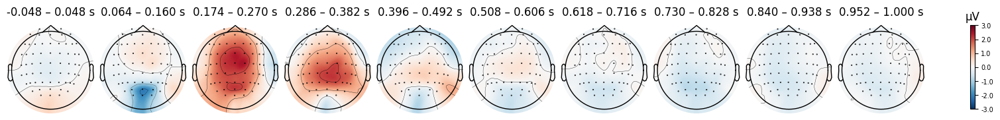

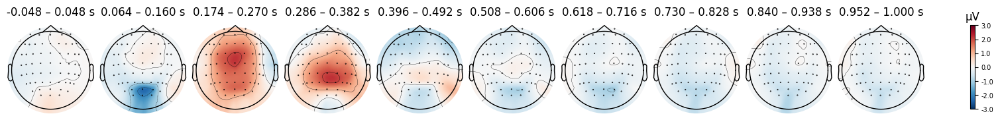

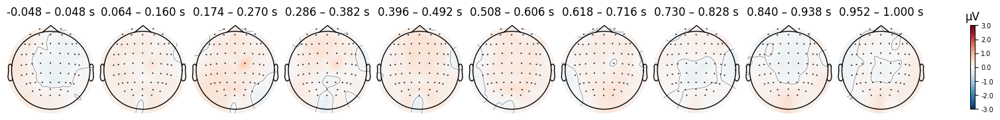

0
0


In [49]:
erps1 = []
erps2 = []
for epoch in eps:
    erps1.append(epoch['true'].average())
    erps2.append(epoch['false'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

Правда (Высокий Experience) - Правда (Низкий Experience)


In [51]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    t = []
    f = []
    res = []
    idx = []
    for i in range(120):
        if cond[i] == 'Правда' and exp[i] == 'high':
            res.append('trueh')
            idx.append(i)
        if cond[i] == 'Правда' and exp[i] == 'low':
            res.append('truel')
            idx.append(i)
    dct = {'trueh' : 1, 'truel' : 2}
    ddct = {1 : 'trueh', 2 : 'truel'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[ 0  2  5 23 43]
sub-004
[ 3 15 17 21 26 30 44 46]
sub-005
[19]
sub-006
[11 13 36 41 58]
sub-007
[ 6  9 43]
sub-008
[ 1 16 29 49 50]
sub-011
[ 2  7 14 22 32 45 59]
sub-012
[ 2  5 12 18 21 23 24 27 28 32 33 37 40 42 44 46 48 50 57 58 60]
sub-013
[ 0  1  8 11 19 23 24 25 27 34 38 41 43 44 50 51 52 53 56 57]
sub-014
[ 7 18 23 27 40 49 52 53 58]
sub-015
[ 3 27 45 50 58]
sub-016
[12]
sub-017
[2 4]
sub-018
[]
sub-019
[10 52]
sub-022
[18 23 24 35 37 38 39 40 41 42 43 52 56]
sub-023
[ 5 12 24 42]
sub-024
[ 7 19]
sub-025
[ 0  9 12 16 27 34 37 38 42 47 48 49 58]
sub-026
[32 50 54]
sub-027
[ 4  6 19 22 27 29 33 40 48 53]
sub-028
[ 0  3  4  9 11 13 20 52]
sub-029
[ 8 13 28 30 44 45 46 50 57]
sub-030
[25 37 56]
sub-031
[15 18 21 33 44 48 49 55]
sub-032
[ 3 46]
sub-033
[43 47 52]
sub-034
[ 7 24 35 44 51 59]
sub-035
[49]
sub-036
[ 0  4  5 11 15 16 38 45 58 60]
sub-037
[19 22 23 44 45 47 48 49 50 55 59]
sub-038
[50]
sub-039
[]
sub-040
[ 3 46 48]
sub-041
[ 0  1  2  3  5  6  7  8 11 12 13 14 15 

In [84]:
cog = mne.concatenate_epochs(mne.match_channel_orders(eps))
#mne.viz.plot_compare_evokeds([cog['truel'].average(), cog['trueh'].average()])

[<Figure size 800x600 with 1 Axes>]

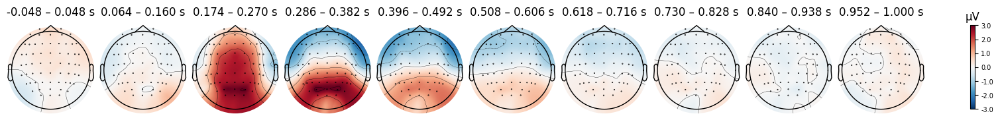

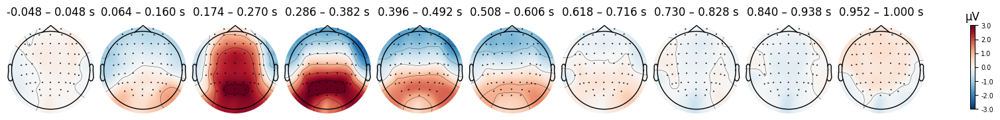

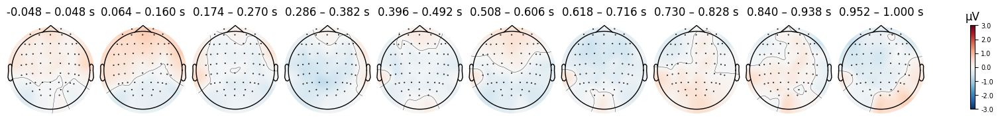

0
0


In [52]:
erps1 = []
erps2 = []
for epoch in eps:
    erps1.append(epoch['trueh'].average())
    erps2.append(epoch['truel'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

Правда (Высокий Rating) - Правда (Низкий Rating)


In [53]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    t = []
    f = []
    res = []
    idx = []
    for i in range(120):
        if cond[i] == 'Правда' and rating[i] == 'high':
            res.append('trueh')
            idx.append(i)
        if cond[i] == 'Правда' and rating[i] == 'low':
            res.append('truel')
            idx.append(i)
    dct = {'trueh' : 1, 'truel' : 2}
    ddct = {1 : 'trueh', 2 : 'truel'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[ 0  2  5 23 43]
sub-004
[ 3 15 17 21 26 30 44 46]
sub-005
[19]
sub-006
[11 13 36 41]
sub-007
[ 6  9 43]
sub-008
[ 1 16 29]
sub-011
[ 2  7 14 22 32 45]
sub-012
[ 2  5 12 18 21 23 24 27 28 32 33 37 40 42 44 46 48 50]
sub-013
[ 0  1  8 11 19 23 24 25 27 34 38 41 43 44 50 51 52 53]
sub-014
[ 7 18 23 27 40 49]
sub-015
[ 3 27 45]
sub-016
[12]
sub-017
[2 4]
sub-018
[]
sub-019
[10]
sub-022
[18 23 24 35 37 38 39 40 41 42 43]
sub-023
[ 5 12 24 42]
sub-024
[ 7 19]
sub-025
[ 0  9 12 16 27 34 37 38 42 47 48 49]
sub-026
[32 50 54]
sub-027
[ 4  6 19 22 27 29 33 40 48]
sub-028
[ 0  3  4  9 11 13 20 52]
sub-029
[ 8 13 28 30 44 45 46]
sub-030
[25 37]
sub-031
[15 18 21 33 44 48 49 55]
sub-032
[ 3 46]
sub-033
[43 47]
sub-034
[ 7 24 35 44]
sub-035
[49]
sub-036
[ 0  4  5 11 15 16 38 45]
sub-037
[19 22 23 44 45 47]
sub-038
[]
sub-039
[]
sub-040
[ 3 46 48]
sub-041
[ 0  1  2  3  5  6  7  8 11 12 13 14 15 54]
sub-042
[20 45]
sub-043
[33]


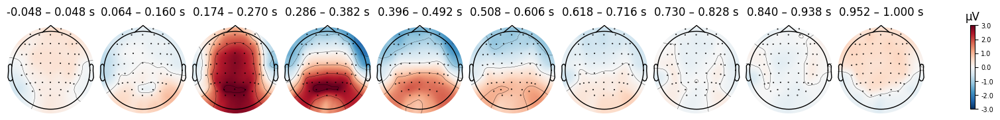

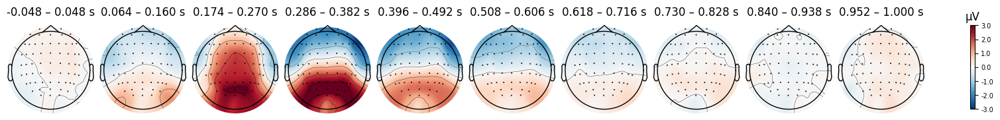

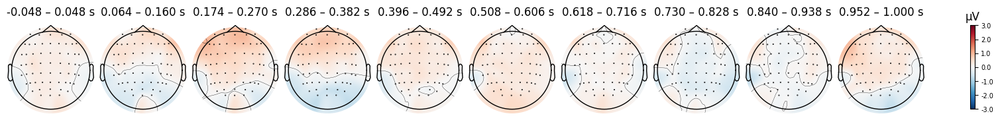

0
0


In [54]:
erps1 = []
erps2 = []
eps1 = []
eps2 = []
for epoch in eps:
    erps1.append(epoch['trueh'].average())
    erps2.append(epoch['truel'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

Обман (Высокий Rating) - Обман (Низкий Rating)


In [55]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    t = []
    f = []
    res = []
    idx = []
    for i in range(120):
        if cond[i] == 'Обман' and rating[i] == 'high':
            res.append('falseh')
            idx.append(i)
        if cond[i] == 'Обман' and rating[i] == 'low':
            res.append('falsel')
            idx.append(i)
    dct = {'falseh' : 1, 'falsel' : 2}
    ddct = {1 : 'falseh', 2 : 'falsel'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[ 0  2  5 23 43]
sub-004
[ 3 15 17 21 26 30 44 46]
sub-005
[19]
sub-006
[11 13 36 41]
sub-007
[ 6  9 43]
sub-008
[ 1 16 29]
sub-011
[ 2  7 14 22 32 45]
sub-012
[ 2  5 12 18 21 23 24 27 28 32 33 37 40 42 44 46]
sub-013
[ 0  1  8 11 19 23 24 25 27 34 38 41 43]
sub-014
[ 7 18 23 27 40]
sub-015
[ 3 27 45]
sub-016
[12]
sub-017
[2 4]
sub-018
[]
sub-019
[10 52]
sub-022
[18 23 24 35 37 38 39 40 41 42 43]
sub-023
[ 5 12 24 42]
sub-024
[ 7 19]
sub-025
[ 0  9 12 16 27 34 37 38 42 47 48 49]
sub-026
[32 50]
sub-027
[ 4  6 19 22 27 29 33 40 48]
sub-028
[ 0  3  4  9 11 13 20]
sub-029
[ 8 13 28 30 44 45 46 50]
sub-030
[25 37]
sub-031
[15 18 21 33]
sub-032
[ 3 46]
sub-033
[43 47]
sub-034
[ 7 24 35 44]
sub-035
[49]
sub-036
[ 0  4  5 11 15 16 38 45]
sub-037
[19 22 23 44 45 47 48 49]
sub-038
[50]
sub-039
[]
sub-040
[ 3 46 48]
sub-041
[ 0  1  2  3  5  6  7  8 11 12 13 14 15]
sub-042
[20 45]
sub-043
[33]


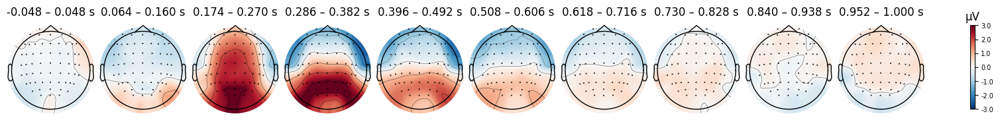

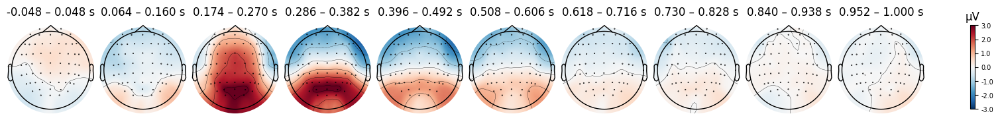

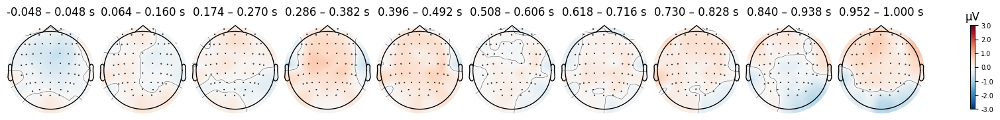

0
0


In [46]:
erps1 = []
erps2 = []
eps1 = []
eps2 = []
for epoch in eps:
    erps1.append(epoch['falseh'].average())
    erps2.append(epoch['falsel'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

In [90]:
cog = mne.concatenate_epochs(mne.match_channel_orders(eps))
mne.viz.plot_compare_evokeds([cog['falsel'].average(), cog['falseh'].average()])

[<Figure size 800x600 with 1 Axes>]

In [56]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    res = []
    idx = []
    for i in range(120):
        if cond[i] == 'Обман' and exp[i] == 'high':
            res.append('falseh')
            idx.append(i)
        if cond[i] == 'Обман' and exp[i] == 'low':
            res.append('falsel')
            idx.append(i)
    dct = {'falseh' : 1, 'falsel' : 2}
    ddct = {1 : 'falseh', 2 : 'falsel'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[ 0  2  5 23 43]
sub-004
[ 3 15 17 21 26 30 44 46]
sub-005
[19]
sub-006
[11 13 36 41 58]
sub-007
[ 6  9 43]
sub-008
[ 1 16 29 49 50]
sub-011
[ 2  7 14 22 32 45 59]
sub-012
[ 2  5 12 18 21 23 24 27 28 32 33 37 40 42 44 46 48 50 57 58]
sub-013
[ 0  1  8 11 19 23 24 25 27 34 38 41 43 44 50 51 52 53 56 57]
sub-014
[ 7 18 23 27 40 49 52 53 58]
sub-015
[ 3 27 45 50 58]
sub-016
[12]
sub-017
[2 4]
sub-018
[]
sub-019
[10 52]
sub-022
[18 23 24 35 37 38 39 40 41 42 43 52 56]
sub-023
[ 5 12 24 42 60]
sub-024
[ 7 19]
sub-025
[ 0  9 12 16 27 34 37 38 42 47 48 49 58]
sub-026
[32 50 54]
sub-027
[ 4  6 19 22 27 29 33 40 48 53]
sub-028
[ 0  3  4  9 11 13 20 52]
sub-029
[ 8 13 28 30 44 45 46 50 57]
sub-030
[25 37 56]
sub-031
[15 18 21 33 44 48 49 55]
sub-032
[ 3 46]
sub-033
[43 47 52]
sub-034
[ 7 24 35 44 51]
sub-035
[49]
sub-036
[ 0  4  5 11 15 16 38 45 58]
sub-037
[19 22 23 44 45 47 48 49 50 55 59]
sub-038
[50]
sub-039
[]
sub-040
[ 3 46 48]
sub-041
[ 0  1  2  3  5  6  7  8 11 12 13 14 15 54 57]

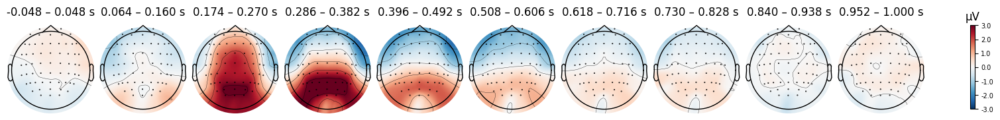

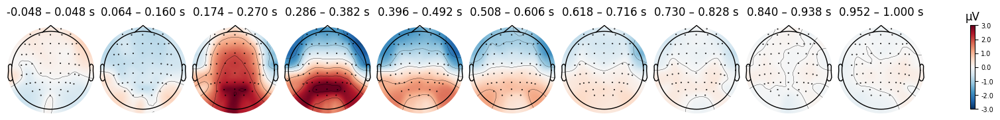

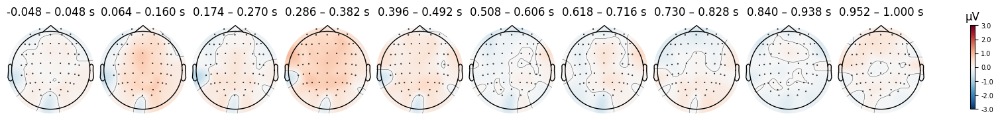

1
0


In [57]:
erps1 = []
erps2 = []
eps1 = []
eps2 = []
for epoch in eps:
    erps1.append(epoch['falseh'].average())
    erps2.append(epoch['falsel'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

Правда (Конг) - Правда (Неконг)


In [59]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    slider2 = np.array(df[['slider_2.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    res = []
    idx = []
    for i in range(120):
        if slider[i] < 4 and cond[i] == 'Правда':
            res.append('incog')
            idx.append(i)
        elif slider[i] > 4 and cond[i] == 'Правда':
            res.append('cog')
            idx.append(i)
    dct = {'incog' : 1, 'cog' : 2}
    ddct = {1 : 'incog', 2 : 'cog'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[ 0  2  5 23 43]
sub-004
[ 3 15 17 21 26 30 44 46]
sub-005
[19]
sub-006
[11 13 36 41]
sub-007
[ 6  9 43]
sub-008
[ 1 16 29 49 50]
sub-011
[ 2  7 14 22 32 45]
sub-012
[ 2  5 12 18 21 23 24 27 28 32 33 37 40 42 44 46 48]
sub-013
[ 0  1  8 11 19 23 24 25 27 34 38 41 43 44 50 51 52]
sub-014
[ 7 18 23 27 40]
sub-015
[ 3 27 45 50]
sub-016
[12]
sub-017
[2 4]
sub-018
[]
sub-019
[10 52]
sub-022
[18 23 24 35 37 38 39 40 41 42 43]
sub-023
[ 5 12 24 42]
sub-024
[ 7 19]
sub-025
[ 0  9 12 16 27 34 37 38 42 47 48 49 58]
sub-026
[32 50 54]
sub-027
[ 4  6 19 22 27 29 33 40]
sub-028
[ 0  3  4  9 11 13 20]
sub-029
[ 8 13 28 30 44 45 46 50]
sub-030
[25 37]
sub-031
[15 18 21 33 44 48 49 55]
sub-032
[3]
sub-033
[43 47 52]
sub-034
[ 7 24 35 44 51]
sub-035
[49]
sub-036
[ 0  4  5 11 15 16 38 45]
sub-037
[19 22 23 44 45 47 48 49 50]
sub-038
[]
sub-039
[]
sub-040
[ 3 46 48]
sub-041
[ 0  1  2  3  5  6  7  8 11 12 13 14 15 54]
sub-042
[20 45]
sub-043
[33]


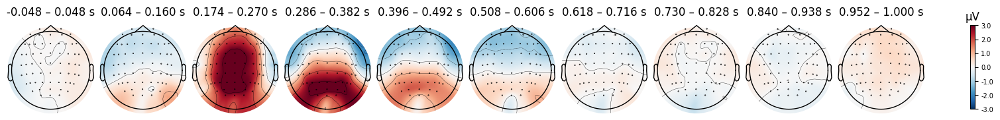

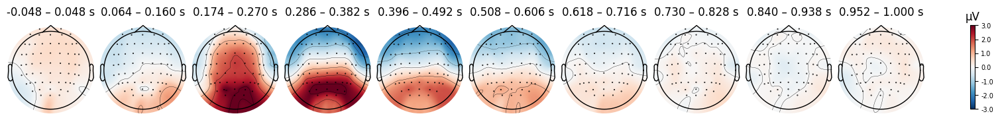

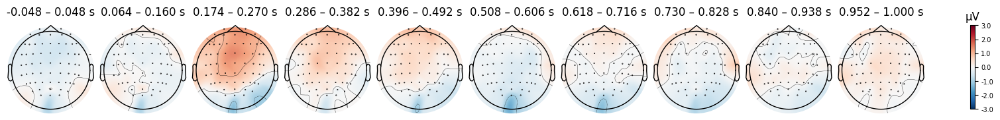

0
0


In [60]:
erps1 = []
erps2 = []
eps1 = []
eps2 = []
for epoch in eps:
    erps1.append(epoch['cog'].average())
    erps2.append(epoch['incog'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

In [92]:
cog = mne.concatenate_epochs(mne.match_channel_orders(eps))
mne.viz.plot_compare_evokeds([cog['cog'].average(), cog['incog'].average()])

[<Figure size 800x600 with 1 Axes>]

Правда (Конф) - Правда (Неконф)


In [72]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    slider2 = np.array(df[['slider_2.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    res = []
    idx = []
    for i in range(120):
        if ((slider2[i] - slider[i] < 0) and cond[i] == 'Правда'):
            res.append('noncon')
            idx.append(i)
        if ((slider2[i] - slider[i] >= 0) and cond[i] == 'Правда'):
            res.append('con')
            idx.append(i)
    dct = {'noncon' : 1, 'con' : 2}
    ddct = {1 : 'noncon', 2 : 'con'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    if name == 'sub-034' or name == 'sub-037':
        dct = {'con' : 2}
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[ 0  2  5 23 43]
sub-004
[ 3 15 17 21 26 30 44 46]
sub-005
[19]
sub-006
[11 13 36 41 58]
sub-007
[ 6  9 43]
sub-008
[ 1 16 29 49 50]
sub-011
[ 2  7 14 22 32 45 59]
sub-012
[ 2  5 12 18 21 23 24 27 28 32 33 37 40 42 44 46 48 50 57 58 60]
sub-013
[ 0  1  8 11 19 23 24 25 27 34 38 41 43 44 50 51 52 53 56 57]
sub-014
[ 7 18 23 27 40 49 52 53 58]
sub-015
[ 3 27 45 50 58]
sub-016
[12]
sub-017
[2 4]
sub-018
[]
sub-019
[10 52]
sub-022
[18 23 24 35 37 38 39 40 41 42 43 52 56]
sub-023
[ 5 12 24 42]
sub-024
[ 7 19]
sub-025
[ 0  9 12 16 27 34 37 38 42 47 48 49 58]
sub-026
[32 50 54]
sub-027
[ 4  6 19 22 27 29 33 40 48 53]
sub-028
[ 0  3  4  9 11 13 20 52]
sub-029
[ 8 13 28 30 44 45 46 50 57]
sub-030
[25 37 56]
sub-031
[15 18 21 33 44 48 49 55]
sub-032
[ 3 46]
sub-033
[43 47 52]
sub-034
[ 7 24 35 44 51 59]
sub-035
[49]
sub-036
[ 0  4  5 11 15 16 38 45 58 60]
sub-037
[19 22 23 44 45 47 48 49 50 55 59]
sub-038
[50]
sub-039
[]
sub-040
[ 3 46 48]
sub-041
[ 0  1  2  3  5  6  7  8 11 12 13 14 15 

In [73]:
erps1 = []
erps2 = []
eps1 = []
eps2 = []
for epoch in eps:
    erps1.append(epoch['con'].average())
    erps2.append(epoch['noncon'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

KeyError: 'Event name "noncon" could not be found. The following events are present in the data: con'

In [100]:
cog = mne.concatenate_epochs(mne.match_channel_orders(eps))
mne.viz.plot_compare_evokeds([cog['con'].average(), cog['noncon'].average()])

[<Figure size 800x600 with 1 Axes>]

Обман (Конф) - Обман (Неконф)


In [ ]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    slider2 = np.array(df[['slider_2.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    res = []
    idx = []
    for i in range(120):
        if ((slider2[i] - slider[i] > 0) and cond[i] == 'Обман'):
            res.append('noncon')
            idx.append(i)
        if ((slider2[i] - slider[i] <= 0) and cond[i] == 'Обман'):
            res.append('con')
            idx.append(i)
    dct = {'noncon' : 1, 'con' : 2}
    ddct = {1 : 'noncon', 2 : 'con'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

In [ ]:
erps1 = []
erps2 = []
eps1 = []
eps2 = []
for epoch in eps:
    erps1.append(epoch['con'].average())
    erps2.append(epoch['noncon'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

Обман (Конг) - Обман (Неконг)


In [74]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    slider2 = np.array(df[['slider_2.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    res = []
    idx = []
    for i in range(120):
        if slider[i] > 4 and cond[i] == 'Обман':
            res.append('incog')
            idx.append(i)
        elif slider[i] < 4 and cond[i] == 'Обман':
            res.append('cog')
            idx.append(i)
    dct = {'incog' : 1, 'cog' : 2}
    ddct = {1 : 'incog', 2 : 'cog'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[ 0  2  5 23 43]
sub-004
[ 3 15 17 21 26 30 44 46]
sub-005
[19]
sub-006
[11 13 36 41]
sub-007
[ 6  9 43]
sub-008
[ 1 16 29 49 50]
sub-011
[ 2  7 14 22 32 45]
sub-012
[ 2  5 12 18 21 23 24 27 28 32 33 37 40 42 44]
sub-013
[ 0  1  8 11 19 23 24 25 27 34 38 41 43 44 50 51]
sub-014
[ 7 18 23 27 40 49]
sub-015
[ 3 27 45]
sub-016
[12]
sub-017
[2 4]
sub-018
[]
sub-019
[10 52]
sub-022
[18 23 24 35 37 38 39 40 41 42 43]
sub-023
[ 5 12 24 42]
sub-024
[ 7 19]
sub-025
[ 0  9 12 16 27 34 37 38 42 47 48 49]
sub-026
[32 50]
sub-027
[ 4  6 19 22 27 29 33 40]
sub-028
[ 0  3  4  9 11 13 20 52]
sub-029
[ 8 13 28 30 44 45 46 50]
sub-030
[25 37]
sub-031
[15 18 21 33 44 48 49]
sub-032
[ 3 46]
sub-033
[43 47 52]
sub-034
[ 7 24 35 44 51]
sub-035
[49]
sub-036
[ 0  4  5 11 15 16 38 45]
sub-037
[19 22 23 44 45 47 48 49 50]
sub-038
[50]
sub-039
[]
sub-040
[ 3 46 48]
sub-041
[ 0  1  2  3  5  6  7  8 11 12 13 14 15]
sub-042
[20 45 56]
sub-043
[33]


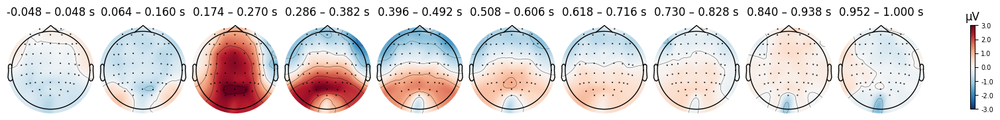

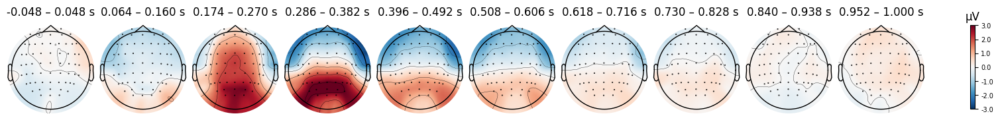

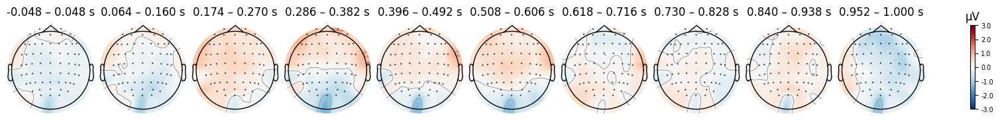

0
0


In [75]:
erps1 = []
erps2 = []
eps1 = []
eps2 = []
for epoch in eps:
    erps1.append(epoch['incog'].average())
    erps2.append(epoch['cog'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

In [103]:
cog = mne.concatenate_epochs(mne.match_channel_orders(eps))
mne.viz.plot_compare_evokeds([cog['cog'].average(), cog['incog'].average()])

[<Figure size 800x600 with 1 Axes>]

Правда - обман отдельно для условий когн, неконг, конф и для высокого experience, для высокого rating


In [76]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    slider2 = np.array(df[['slider_2.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    res = []
    idx = []
    for i in range(120):
        if slider[i] > 4 and cond[i] == 'Правда':
            res.append('true')
            idx.append(i)
        elif slider[i] < 4 and cond[i] == 'Обман':
            res.append('false')
            idx.append(i)
    dct = {'true' : 1, 'false' : 2}
    ddct = {1 : 'true', 2 : 'false'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[ 0  2  5 23 43]
sub-004
[ 3 15 17 21 26 30 44 46 60]
sub-005
[19]
sub-006
[11 13 36 41]
sub-007
[ 6  9 43]
sub-008
[ 1 16 29 49 50 70]
sub-011
[ 2  7 14 22 32 45]
sub-012
[ 2  5 12 18 21 23 24 27 28 32 33 37 40 42 44 46 48 50 57 58 60 61]
sub-013
[ 0  1  8 11 19 23 24 25 27 34 38 41 43 44 50 51 52 53 56 57]
sub-014
[ 7 18 23 27 40 49]
sub-015
[ 3 27 45 50 58]
sub-016
[12]
sub-017
[2 4]
sub-018
[60]
sub-019
[10 52 61]
sub-022
[18 23 24 35 37 38 39 40 41 42 43 52 56]
sub-023
[ 5 12 24 42 60]
sub-024
[ 7 19]
sub-025
[ 0  9 12 16 27 34 37 38 42 47 48 49 58 60 61 62 63 65]
sub-026
[32 50 54]
sub-027
[ 4  6 19 22 27 29 33 40 48]
sub-028
[ 0  3  4  9 11 13 20 52 64 68]
sub-029
[ 8 13 28 30 44 45 46 50 57 63 65 67]
sub-030
[25 37 56]
sub-031
[15 18 21 33 44 48 49 55]
sub-032
[ 3 46]
sub-033
[43 47 52]
sub-034
[ 7 24 35 44 51 59]
sub-035
[49 61 65]
sub-036
[ 0  4  5 11 15 16 38 45 58 60 61]
sub-037
[19 22 23 44 45 47 48 49 50 55 59 60 62 63 64 65]
sub-038
[50]
sub-039
[]
sub-040
[ 3 46

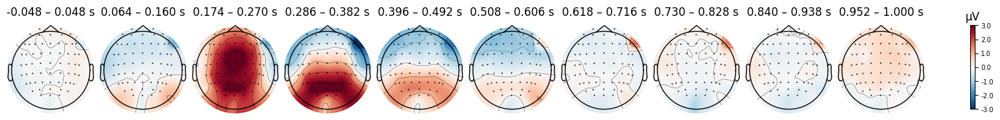

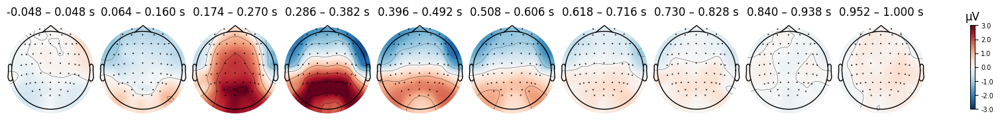

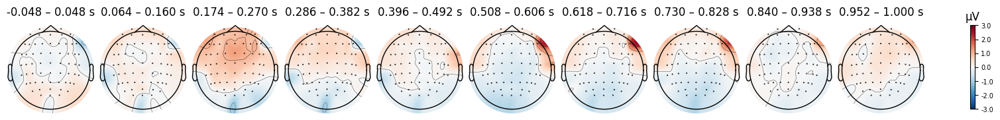

0
0


In [77]:
erps1 = []
erps2 = []
eps1 = []
eps2 = []
for epoch in eps:
    erps1.append(epoch['true'].average())
    erps2.append(epoch['false'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

In [115]:
cog = mne.concatenate_epochs(mne.match_channel_orders(eps))
mne.viz.plot_compare_evokeds([cog['true'].average(), cog['false'].average()])

[<Figure size 800x600 with 1 Axes>]

In [78]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    slider2 = np.array(df[['slider_2.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    res = []
    idx = []
    for i in range(120):
        if ((slider2[i] - slider[i] >= 0) and cond[i] == 'Правда') :
            res.append('true')
            idx.append(i)
        if ((slider2[i] - slider[i] <= 0) and cond[i] == 'Обман'):
            res.append('false')
            idx.append(i)
    dct = {'true' : 1, 'false' : 2}
    ddct = {1 : 'true', 2 : 'false'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[  0   2   5  23  43  88  96 107]
sub-004
[ 3 15 17 21 26 30 44 46 60 67 72 73 81 87 94 98]
sub-005
[19]
sub-006
[ 11  13  36  41  58  93  98 103 106]
sub-007
[ 6  9 43 79]
sub-008
[  1  16  29  49  50  70  85  90 102]
sub-011
[ 2  7 14 22 32 45 59 66 71 90]
sub-012
[ 2  5 12 18 21 23 24 27 28 32 33 37 40 42 44 46 48 50 57 58 60 61 62 63
 65 66 67 69 70 72 76 78 79 81 84 86]
sub-013
[  0   1   8  11  19  23  24  25  27  34  38  41  43  44  50  51  52  53
  56  57  66  68  72  75  78  83  84  90 100 103 104]
sub-014
[ 7 18 23 27 40 49 52 53 58 74 81 82 85 88 94]
sub-015
[ 3 27 45 50 58 75 80 90 91 92 98]
sub-016
[ 12 109 110]
sub-017
[ 2  4 90 93]
sub-018
[ 60  68  75  88 100 104]
sub-019
[10 52 61 80 81 87 92 93 94 96 98]
sub-022
[ 18  23  24  35  37  38  39  40  41  42  43  52  56  81  87  92  93 101
 105]
sub-023
[  5  12  24  42  60  70  84  86  93 105]
sub-024
[  7  19  70  81  91 112 113]
sub-025
[ 0  9 12 16 27 34 37 38 42 47 48 49 58 60 61 62 63 65 69 72 80 91]
sub-026
[

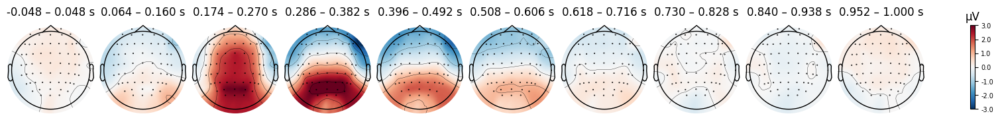

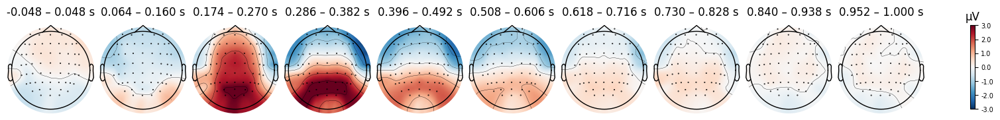

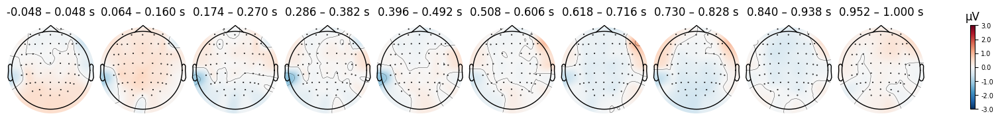

0
0


In [79]:
erps1 = []
erps2 = []
eps1 = []
eps2 = []
for epoch in eps:
    erps1.append(epoch['true'].average())
    erps2.append(epoch['false'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

In [80]:
#cog = []
#incog = []
#filler = []
eps = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    bads = []
    if name in list(bad['Subjects']):
        bads = ast.literal_eval(list(bad[bad['Subjects'] == name]['Indexes of epochs to be dropped'])[0])
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    slider2 = np.array(df[['slider_2.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    exp = np.array(df['experience'].dropna())
    rating = np.array(df['rating'].dropna())
    res = []
    idx = []
    for i in range(120):
        if cond[i] == 'Правда' and rating[i] == 'high':
            res.append('true')
            idx.append(i)
        if cond[i] == 'Обман' and rating[i] == 'high':
            res.append('false')
            idx.append(i)
    dct = {'true' : 1, 'false' : 2}
    ddct = {1 : 'true', 2 : 'false'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[idx ,:]
    events[:, 2] = evnts
    bads = np.extract(np.array(bads) < len(events), bads)
    print(bads)
    events = np.delete(events, bads, axis=0)
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    eps.append(epochs)
    gc.collect()
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    #epochs.save(f'doctors/epochs_HE/{name}_epochs.fif', overwrite = True)

sub-003
[ 0  2  5 23 43]
sub-004
[ 3 15 17 21 26 30 44 46]
sub-005
[19]
sub-006
[11 13 36 41]
sub-007
[ 6  9 43]
sub-008
[ 1 16 29]
sub-011
[ 2  7 14 22 32]
sub-012
[ 2  5 12 18 21 23 24 27 28 32 33 37 40 42 44 46 48 50]
sub-013
[ 0  1  8 11 19 23 24 25 27 34 38 41 43 44]
sub-014
[ 7 18 23 27 40 49 52]
sub-015
[ 3 27 45]
sub-016
[12]
sub-017
[2 4]
sub-018
[]
sub-019
[10]
sub-022
[18 23 24 35 37 38 39 40 41 42 43]
sub-023
[ 5 12 24]
sub-024
[ 7 19]
sub-025
[ 0  9 12 16 27 34 37 38 42 47 48 49]
sub-026
[32 50]
sub-027
[ 4  6 19 22 27 29 33 40]
sub-028
[ 0  3  4  9 11 13 20 52]
sub-029
[ 8 13 28 30 44 45 46 50]
sub-030
[25 37]
sub-031
[15 18 21 33 44 48 49 55]
sub-032
[ 3 46]
sub-033
[43 47]
sub-034
[ 7 24 35 44]
sub-035
[49]
sub-036
[ 0  4  5 11 15 16 38 45]
sub-037
[19 22 23 44 45 47 48 49]
sub-038
[50]
sub-039
[]
sub-040
[ 3 46 48]
sub-041
[ 0  1  2  3  5  6  7  8 11 12 13 14 15]
sub-042
[20 45]
sub-043
[33]


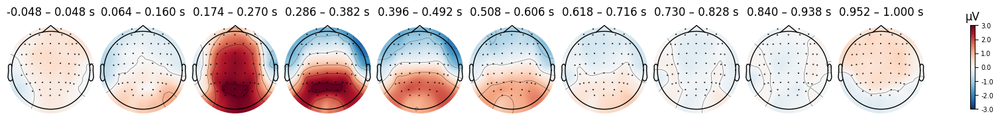

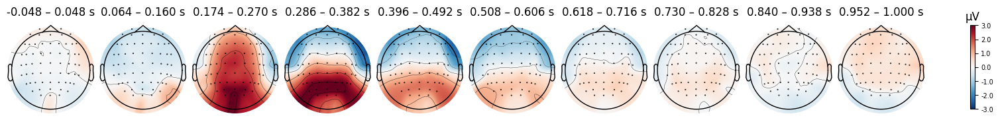

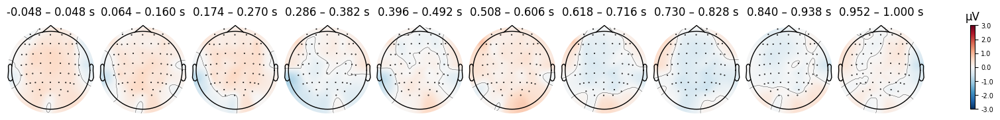

0
0


In [81]:
erps1 = []
erps2 = []
eps1 = []
eps2 = []
for epoch in eps:
    erps1.append(epoch['true'].average())
    erps2.append(epoch['false'].average())
ga_1 = mne.grand_average(erps1)
ga_2 = mne.grand_average(erps2)
res = []
for i in range(len(erps1)):
    res.append(np.mean(erps1[i].data, axis=0))
res2 = []
for i in range(len(erps2)):
    res2.append(np.mean(erps2[i].data, axis=0))
erps1 = np.array([erp.get_data() for erp in erps1])
erps2 = np.array([erp.get_data() for erp in erps2])


display(ga_1.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
display(ga_2.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))
ga_diff = mne.combine_evoked([ga_1, ga_2], weights=[1, -1])
display(ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1))


res = np.array(res)
res2 = np.array(res2)
T_obs, p_values, ____ = mne.stats.permutation_t_test(res2-res, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
print(sum(significance_mask))

T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test([erps1, erps2], n_permutations = 1024, tail = 0)
significance_mask = cluster_p_values < 0.05 
print(sum(significance_mask))

**Здесь заканчивается актуальный код**

**Конформные/неконформные**


In [6]:
#confirmity
#cog = []
#incog = []
#filler = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    slider2 = np.array(df[['slider_2.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    res = []
    for i in range(120):
        if ((slider2[i] - slider[i] < 0) and cond[i] == 'Правда') or ((slider2[i] - slider[i] > 0) and cond[i] == 'Обман'):
            res.append('noncon')
        if ((slider2[i] - slider[i] >= 0) and cond[i] == 'Правда') or ((slider2[i] - slider[i] <= 0) and cond[i] == 'Обман'):
            res.append('con')
    dct = {'con' : 1, 'noncon' : 2}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[events[:, 2] == 3][2:]
    if name == 'sub-028' or name == 'sub-035':
        events[:, 2] = evnts[2:]
    elif name == 'sub-037':
        events[:, 2] = evnts[1:]
    else:
        events[:, 2] = evnts
    #events[:, 2] = evnts
    epochs = mne.Epochs(
        raw, events=events, event_id=dct ,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0]
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    epochs.plot(block = True)
    epochs.interpolate_bads()
    epochs.drop_bad()
    epochs.save(f'doctors/epochs_conf/{name}_epochs.fif', overwrite = True)

sub-003
sub-004
sub-005
sub-006
sub-007
sub-008
sub-011
sub-012
sub-013
sub-014
sub-015
sub-016
sub-017
sub-018
sub-019
sub-022
sub-023
sub-024
sub-025
sub-026
sub-027
sub-028
sub-029
sub-030
sub-031
sub-032
sub-033
sub-034
sub-035
sub-036
sub-037
sub-038
sub-039
sub-040
sub-041
sub-042
sub-043


**Конгруэнтные/неконгруэнтные с поправкой на рейтинг эксперта**


In [52]:
#cog = []
#incog = []
#filler = []
for elem in os.listdir('doctors/beh'):
    name = elem.split('_')[0]
    print(name)
    df = pd.read_csv('doctors/beh/' + elem)
    raw = mne.io.read_raw(f'eeg/{name}_experiment.fif', preload = True)
    slider = np.array(df[['slider.response']][4:].dropna())
    cond = np.array(df[['cond']][4:].dropna())
    experience = np.array(df[['experience']][4:].dropna())
    rating = np.array(df[['rating']][4:].dropna())
    res = []
    for i in range(120):
        if (slider[i] < 4 and cond[i] == 'Правда' or slider[i] > 4 and cond[i] == 'Обман') and rating[i] == 'high':
            res.append('incog')
        elif (slider[i] > 4 and cond[i] == 'Правда' or slider[i] < 4 and cond[i] == 'Обман') and rating[i] == 'high':
            res.append('cog')
        elif (slider[i] == 4) and experience[i] == 'high':
            res.append('filler')
        else:
            res.append('drop')
    dct = {'cog' : 1, 'incog' : 2, 'filler' : 3, 'drop': 4}
    dct1 = {'cog' : 1, 'incog' : 2, 'filler' : 3}
    ddct = {1 : 'cog', 2 : 'incog', 3 : 'filler'}
    evnts = []
    for i in range(len(res)):
        evnts.append(dct[res[i]])
    events, ids = mne.events_from_annotations(raw)
    events = events[events[:, 2] == 3][2:] 
    if name == 'sub-028' or name == 'sub-035':
        events[:, 2] = evnts[2:]
    elif name == 'sub-037':
        events[:, 2] = evnts[1:]
    else:
        events[:, 2] = evnts
    epochs = mne.Epochs(
        raw, events=events, event_id=dct1,tmin=-0.5, tmax=1, preload=True, baseline= [-0.5, 0], on_missing='warn'
        #raw, events=events, event_id=dct ,tmin=0, tmax=1, preload=True, baseline=None
    )
    #epochs.plot(block = True)
    #epochs.interpolate_bads()
    #epochs.drop_bad()
    epochs.save(f'epochs_HR/{name}_epochs.fif', overwrite = True)

sub-003
sub-004
sub-005
sub-006
sub-007
sub-008
sub-011
sub-012
sub-013
sub-014
sub-015
sub-016
sub-017
sub-018
sub-019
sub-022
sub-023
sub-024
sub-025
sub-026
sub-027
sub-028
sub-029
sub-030
sub-031
sub-032
sub-033
sub-034
sub-035
sub-036
sub-037
sub-038
sub-039
sub-040
sub-041
sub-042
sub-043


Создаём файлы с evokedами по условиям


In [74]:
cog = []
incog = []
filler = []
for i in os.listdir('doctors/epochs_conf'):
    epochs = mne.read_epochs(f'doctors/epochs_conf/{i}')
    cog.append(epochs['con'].average())
    incog.append(epochs['noncon'].average())
    #filler.append(epochs['filler'].average())
    gc.collect()

# Отрисовка ERP и анализ


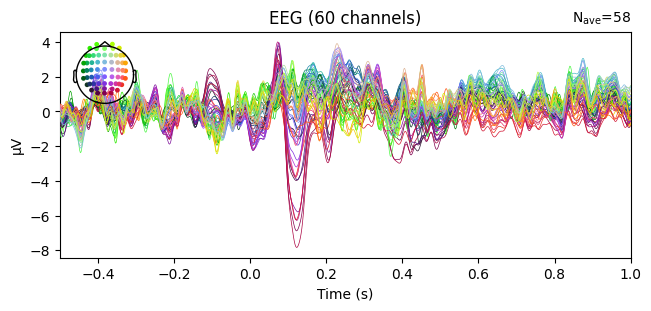

In [59]:
epochs['cog'].average().plot()

In [157]:
cog.pop(23)
incog.pop(23)
filler.pop(23)

<Evoked | 'filler' (average, N=13), -0.5 – 1 s, baseline -0.5 – 0 s, 60 ch, ~426 KiB>

In [75]:
res = []
for i in range(len(cog)):
    res.append(np.mean(cog[i].data, axis=0))

In [76]:
res_incog = []
for i in range(len(incog)):
    res_incog.append(np.mean(incog[i].data, axis=0))

In [77]:
res = np.array(res)
res_incog = np.array(res_incog)

In [78]:
res_diff = []
for i in range(len(incog)):
    res_diff.append(np.mean(incog[i].data, axis=0)-np.mean(cog[i].data, axis=0))

In [24]:
res_diff

[array([-8.08567469e-07, -6.34394034e-07, -5.48768836e-07, -5.91443311e-07,
        -7.65340174e-07, -1.03368733e-06, -1.32858693e-06, -1.57163905e-06,
        -1.69767074e-06, -1.67521508e-06, -1.51550344e-06, -1.26896770e-06,
        -1.00949634e-06, -8.10890432e-07, -7.23732083e-07, -7.60822178e-07,
        -8.94514113e-07, -1.06695966e-06, -1.20979056e-06, -1.26556699e-06,
        -1.20516281e-06, -1.03547192e-06, -7.94636660e-07, -5.37390269e-07,
        -3.16698013e-07, -1.65773401e-07, -8.82563065e-08, -5.86129157e-08,
        -3.25546924e-08,  3.53665524e-08,  1.74977446e-07,  3.88838749e-07,
         6.48972628e-07,  9.04793695e-07,  1.09752905e-06,  1.17776864e-06,
         1.12061696e-06,  9.33715162e-07,  6.55099759e-07,  3.42630427e-07,
         5.94648782e-08, -1.42466489e-07, -2.35478890e-07, -2.20854626e-07,
        -1.25678685e-07,  6.27737631e-09,  1.27112031e-07,  1.96768248e-07,
         1.92557618e-07,  1.12726540e-07, -2.44535789e-08, -1.87251589e-07,
        -3.3

In [116]:
np.array(res_diff).shape

(35, 751)

In [79]:
T_obs, p_values, ____ = mne.stats.permutation_t_test(res-res_incog, n_permutations = 1024, tail = 0)
significance_mask = p_values < 0.05 
sum(significance_mask)

np.int64(0)

In [85]:
import matplotlib.pyplot as plt
import numpy as np

# Assume T_obs and significance_mask are already defined
# T_obs: array of t-values
# significance_mask: boolean array where True = significant

plt.figure(figsize=(10, 5))

# Plot all t-values
plt.plot(T_obs, label='All T-values', color='skyblue')

# Overlay significant t-values
plt.plot(np.where(significance_mask)[0],
         T_obs[significance_mask],
         'ro', label='Significant T-values')

# Add horizontal line at zero for reference
plt.axhline(0, color='gray', linestyle='--')

# Labels and title
plt.xlabel('Feature index (e.g., time point or sensor)')
plt.ylabel('T-value')
plt.title('T-values with Significant Points Highlighted')
plt.legend()
plt.tight_layout()
plt.show()

In [125]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8, 4))
plt.plot(np.where(significance_mask)[0], T_obs[significance_mas], 'ro', label='Significant t-values')
plt.axhline(0, color='gray', linestyle='--')
plt.xlabel('Feature index')
plt.ylabel('T-value')
plt.title('Significant T-values')
plt.legend()
plt.tight_layout()
plt.show()

NameError: name 'significance_mas' is not defined

In [128]:
p_values

array([1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.     

In [81]:
ga_cog = mne.grand_average(cog)
ga_incog = mne.grand_average(incog)

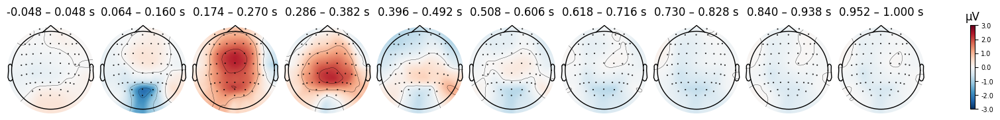

In [82]:
ga_cog.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1)

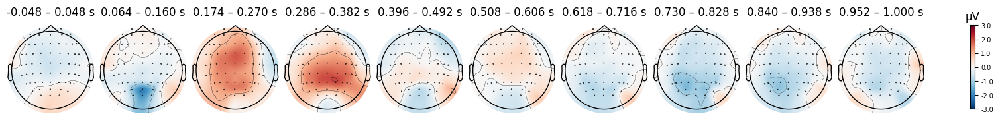

In [86]:
ga_incog.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1)

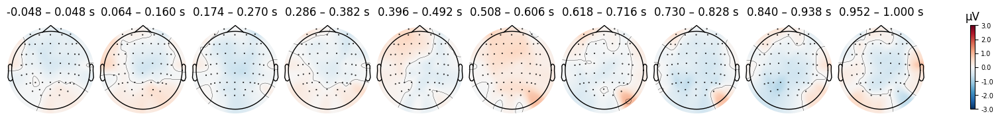

In [84]:
ga_diff = mne.combine_evoked([ga_incog, ga_cog], weights=[1, -1])
ga_diff.plot_topomap(times = np.linspace(0, 1, 10), vlim=(-3, 3), average = 0.1)

In [27]:
x_str = "1:2;3.4" 
list(x_str.split(';'))

['1:2', '3.4']

In [25]:
new = x_str.split(';')

In [146]:
for erp in cog:
    erp.plot()

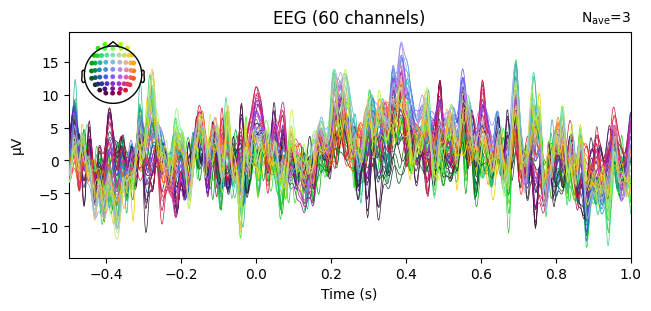

In [37]:
incog[23].plot()

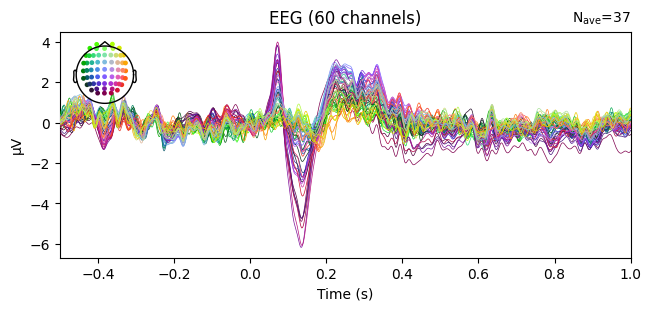

In [38]:
ga_cog.plot()

In [38]:
mne.viz.plot_compare_evokeds({"Congruent": ga_cog, "Incongruent": ga_incog}, combine = 'mean')

[<Figure size 800x600 with 1 Axes>]

In [42]:
res = np.array(res)
res_incog = np.array(res_incog)

In [39]:
res.shape

(33, 751)

In [34]:
T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test(res-res_incog, n_permutations = 1024, n_jobs = -1, out_type = "mask")

In [58]:
T_obs, clusters, cluster_p_values, H0 = mne.stats.spatio_temporal_cluster_test(res_incog-res, n_permutations = 1024, n_jobs = -1, out_type = "mask")

In [101]:
clusters

[(slice(0, 1, None),)]

In [47]:
import matplotlib.pyplot as plt

In [35]:
times = ga_cog.times
axes = plt.gca()  # More direct than get_axes()[0]
plt.grid(True, linestyle='--', alpha=0.7)

for i_c, (cluster, p_val) in enumerate(zip(clusters, cluster_p_values)):
    cluster_slice = cluster[0]  # Unpack 1-tuple
    start, stop = cluster_slice.start, cluster_slice.stop

    if times[start] > 0 and (stop - start > 5):
        color = 'r' if p_val <= 0.05 else (0.1, 0.1, 0.1)
        alpha = 0.3 if p_val <= 0.05 else 0.1
        axes.axvspan(times[start], times[stop - 1], color=color, alpha=alpha)

axes.set_ylim(-1.5, 1.0)  # Consistent axis orientation

NameError: name 'plt' is not defined

In [36]:
times = ga.times
axes = plt.gcf()
plt.grid(True, linestyle='--', alpha=0.7)
for i_c, c in enumerate(clusters):
    c = c[0]  # routine to get slice in 1-tuple
    if times[c.start] > 0 and (c.stop - c.start > 5):
        #if cluster_p_values[i_c] <= 0.05:
        axes.axvspan(times[c.start], times[c.stop - 1], color="r", alpha=0.3)
        #else:
        '''
        axes.axvspan(
                times[c.start],
                times[c.stop - 1],
                color=(0.1, 0.1, 0.1),
                alpha=0.1,
            )
            '''
axes.set_ylim(1.0, -1.5)

NameError: name 'ga' is not defined

In [24]:
cog = mne.concatenate_epochs(mne.match_channel_orders(cog))

In [25]:
incog = mne.concatenate_epochs(mne.match_channel_orders(incog))

In [26]:
filler = mne.concatenate_epochs(mne.match_channel_orders(filler))

In [72]:
ga = mne.grand_average([filler.average()])

In [73]:
gacog = mne.grand_average([cog.average()])

In [74]:
cond_list = ['filler', 'cog', 'incog']
pairs = [(1,0), (2,0), (2,1)]

In [125]:
mne.grand_average([filler.pick_channels(['P7', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO3', 'POz', 'PO4', 'PO8']).average()]).plot()

AttributeError: 'list' object has no attribute 'pick_channels'

In [33]:
differences = {}

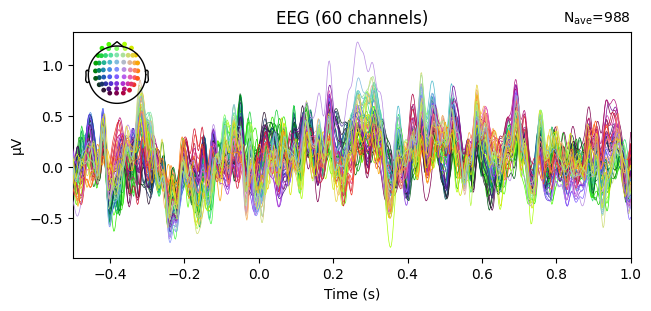

In [46]:
cog
%matplotlib tk

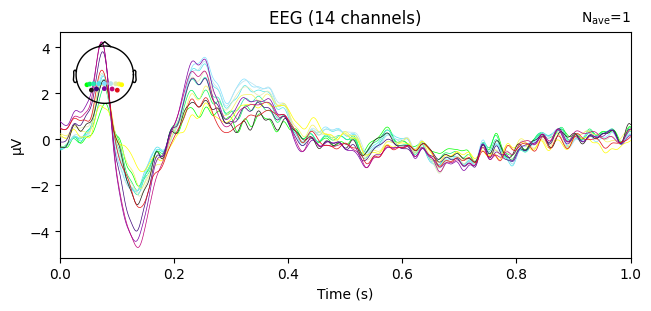

In [35]:
mne.grand_average([filler.average()]).plot()

In [45]:
filler.drop_channels(['AF7', 'Oz'])

ValueError: Channel(s) AF7, Oz not found, nothing dropped.

In [ ]:
incog.drop_channels(['AF7', 'Oz'])

In [140]:
cog.drop_channels(['AF7', 'Oz'])

Number of events,1575
Events,cog: 1575
Time range,0.000 – 1.000 s
Baseline,off


In [42]:
mne.viz.plot_compare_evokeds([incog['incog'].average(), filler['filler'].average()])

ValueError: <Evoked | 'incog' (average, N=1013), 0 – 1 s, baseline off, 60 ch, ~309 KiB> and <Evoked | 'filler' (average, N=412), 0 – 1 s, baseline off, 14 ch, ~94 KiB> do not contain the same channels.

In [128]:
incog['incog'].ch_names

['Fp1',
 'Fz',
 'F3',
 'F7',
 'HEOG',
 'FC5',
 'FC1',
 'C3',
 'T7',
 'CP5',
 'CP1',
 'Pz',
 'P3',
 'P7',
 'O1',
 'Oz',
 'O2',
 'P4',
 'P8',
 'CP6',
 'CP2',
 'Cz',
 'C4',
 'T8',
 'VEOG',
 'FC6',
 'FC2',
 'F4',
 'F8',
 'Fp2',
 'AF7',
 'AF3',
 'AFz',
 'F1',
 'F5',
 'FT7',
 'FC3',
 'C1',
 'C5',
 'TP7',
 'CP3',
 'P1',
 'P5',
 'PO7',
 'PO3',
 'POz',
 'PO4',
 'PO8',
 'P6',
 'P2',
 'CPz',
 'CP4',
 'TP8',
 'C6',
 'C2',
 'FC4',
 'FT8',
 'F6',
 'AF8',
 'AF4',
 'F2',
 'FCz']

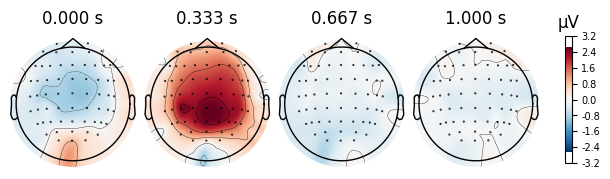

In [41]:
cog['cog'].average().plot_topomap()

In [ ]:
mne.viz.plot_evoked_topomap(mne.grand_average(cog['cog'].average()))

TypeError: object of type 'EvokedArray' has no len()

In [118]:
events, event_id = mne.events_from_annotations(raw)
events

array([[  73746,       0,       1],
       [  88405,       0,       3],
       [ 103589,       0,       1],
       [ 117581,       0,       1],
       [ 128173,       0,       1],
       [ 142182,       0,       1],
       [ 156316,       0,       1],
       [ 166192,       0,       1],
       [ 178300,       0,       1],
       [ 188784,       0,       3],
       [ 201185,       0,       1],
       [ 208760,       0,       1],
       [ 217385,       0,       1],
       [ 228994,       0,       1],
       [ 238278,       0,       3],
       [ 253420,       0,       3],
       [ 270871,       0,       2],
       [ 281880,       0,       1],
       [ 295705,       0,       3],
       [ 304989,       0,       3],
       [ 315014,       0,       1],
       [ 327423,       0,       3],
       [ 339423,       0,       1],
       [ 351957,       0,       1],
       [ 374450,       0,       3],
       [ 385575,       0,       1],
       [ 395334,       0,       3],
       [ 404009,       0,   

In [119]:
event_id

{'cog': 1, 'filler': 2, 'incog': 3}

In [105]:
events

array([[  73746,       0,       1],
       [  88405,       0,       3],
       [ 103589,       0,       1],
       [ 117581,       0,       1],
       [ 128173,       0,       1],
       [ 142182,       0,       1],
       [ 156316,       0,       1],
       [ 166192,       0,       1],
       [ 178300,       0,       1],
       [ 188784,       0,       3],
       [ 201185,       0,       1],
       [ 208760,       0,       1],
       [ 217385,       0,       1],
       [ 228994,       0,       1],
       [ 238278,       0,       3],
       [ 253420,       0,       3],
       [ 270871,       0,       2],
       [ 281880,       0,       1],
       [ 295705,       0,       3],
       [ 304989,       0,       3],
       [ 315014,       0,       1],
       [ 327423,       0,       3],
       [ 339423,       0,       1],
       [ 351957,       0,       1],
       [ 374450,       0,       3],
       [ 385575,       0,       1],
       [ 395334,       0,       3],
       [ 404009,       0,   